## Real-time selective sequencing using nanopore technology. Figures and Analysis

### Introduction

Figure 3 and Figure S3

This jupyter notebook requires the R kernel. 

Each figure from the manuscript "Real-time seletive sequencing using nanopore technology" is reproduced in this notebook. Figures are presented by panel and in the order in which they are considered in the manuscript.

In [1]:
library(ggplot2)
library("gridExtra")
library("plyr")

### Figure 3 - Selective Sequencing of Amplicons

In [19]:
##First collect the data from the BAM files to process.
NO_RU_2D = read.csv("data/fig3/NO_RU/NO_RU_2D.txt_in_50_windows.txt", header = FALSE,sep="\t")
NO_RU_Complement = read.csv("data/fig3/NO_RU/NO_RU_Complement.txt_in_50_windows.txt", header = FALSE,sep="\t")
NO_RU_Template = read.csv("data/fig3/NO_RU/NO_RU_Template.txt_in_50_windows.txt", header = FALSE,sep="\t")

RU_dudu_2D = read.csv("data/fig3/RU_dudu/RU_dudu_2D.txt_in_50_windows.txt", header = FALSE,sep="\t")
RU_dudu_Complement = read.csv("data/fig3/RU_dudu/RU_dudu_Complement.txt_in_50_windows.txt", header = FALSE,sep="\t")
RU_dudu_Template = read.csv("data/fig3/RU_dudu/RU_dudu_Template.txt_in_50_windows.txt", header = FALSE,sep="\t")

RU_udud_2D = read.csv("data/fig3/RU_udud/RU_udud_2D.txt_in_50_windows.txt", header = FALSE,sep="\t")
RU_udud_Complement = read.csv("data/fig3/RU_udud/RU_udud_Complement.txt_in_50_windows.txt", header = FALSE,sep="\t")
RU_udud_Template = read.csv("data/fig3/RU_udud/RU_udud_Template.txt_in_50_windows.txt", header = FALSE,sep="\t")


NO_RU_2D <-cbind(NO_RU_2D,Type="2d")
NO_RU_Complement <-cbind(NO_RU_Complement,Type="Complement")
NO_RU_Template <-cbind(NO_RU_Template,Type="Template")
NO_RU<-rbind(NO_RU_2D,NO_RU_Complement,NO_RU_Template)

colnames(NO_RU) <- c("Ref", "Position","Depth","Type")
NO_RU<-cbind(NO_RU,Experiment="A) No Read Until Applied")

RU_udud_2D <-cbind(RU_udud_2D,Type="2d")
RU_udud_Complement <-cbind(RU_udud_Complement,Type="Complement")
RU_udud_Template <-cbind(RU_udud_Template,Type="Template")
RU_udud<-rbind(RU_udud_2D,RU_udud_Complement,RU_udud_Template)

colnames(RU_udud) <- c("Ref", "Position","Depth","Type")
RU_udud<-cbind(RU_udud,Experiment="B) Selecting Odd Numbered Amplicons")

RU_dudu_2D <-cbind(RU_dudu_2D,Type="2d")
RU_dudu_Complement <-cbind(RU_dudu_Complement,Type="Complement")
RU_dudu_Template <-cbind(RU_dudu_Template,Type="Template")
RU_dudu<-rbind(RU_dudu_2D,RU_dudu_Complement,RU_dudu_Template)

#RU_dudu<-cbind(RU_dudu_Template,RU_dudu_Complement$V3,RU_dudu_2D$V3)
colnames(RU_dudu) <- c("Ref", "Position","Depth","Type")
RU_dudu<-cbind(RU_dudu,Experiment="C) Selecting Even Numbered Amplicons")
Amplicons <-rbind(NO_RU,RU_udud,RU_dudu)

#### Showing template, complement and 2D data

Warning message:
: Removed 79356 rows containing missing values (geom_path).

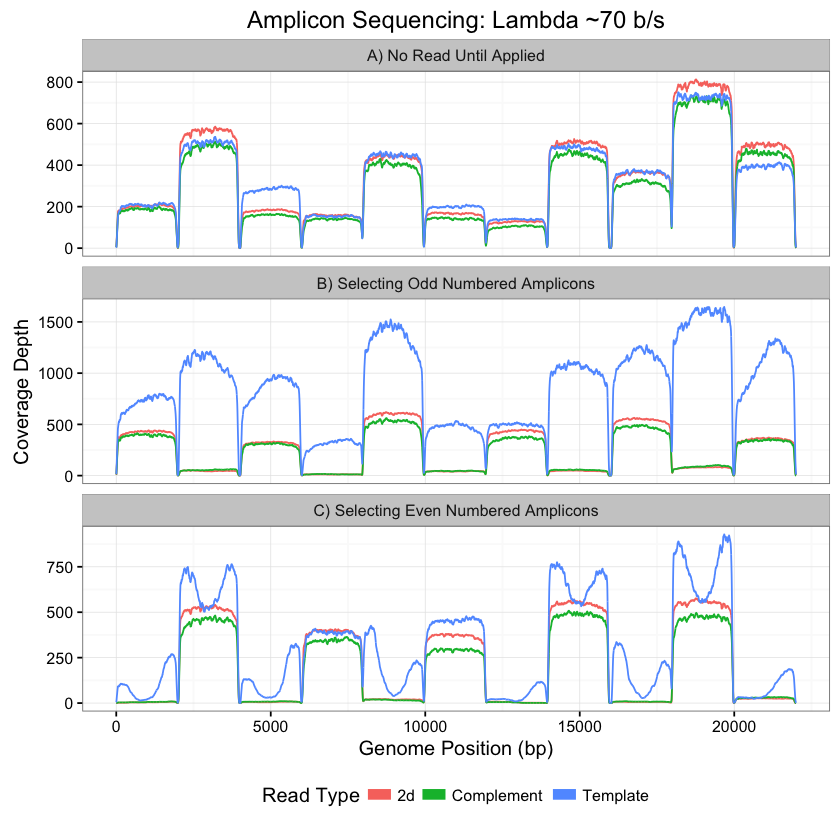

In [20]:
ggplot(data=Amplicons,aes(x=Position,y=Depth,color=Type)) + theme_bw()  + geom_line(size=0.5)+ labs(x = "Genome Position (bp)")+labs(y="Coverage Depth",title = "Amplicon Sequencing: Lambda ~70 b/s")   + xlim(0,22000) + facet_wrap(~Experiment,ncol=1,scales="free_y") + scale_colour_discrete(name  = "Read Type") + theme(legend.position="bottom" , legend.key = element_blank() ) + guides(colour = guide_legend(override.aes = list(size=3)))

#### Showing just 2D data.


Warning message:
: Removed 26452 rows containing missing values (geom_path).

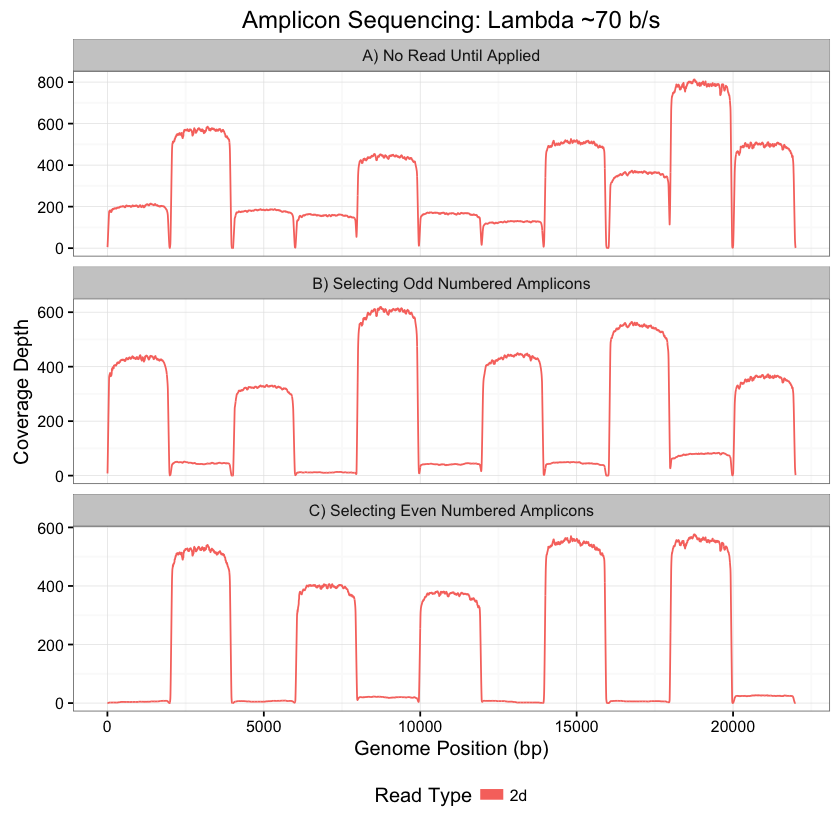

In [21]:
ggplot(data=Amplicons[Amplicons$Type=="2d",],aes(x=Position,y=Depth,color=Type)) + theme_bw()  + geom_line(size=0.5)+ labs(x = "Genome Position (bp)")+labs(y="Coverage Depth",title = "Amplicon Sequencing: Lambda ~70 b/s")   + xlim(0,22000) + facet_wrap(~Experiment,ncol=1,scales="free_y") + scale_colour_discrete(name  = "Read Type") + theme(legend.position="bottom" , legend.key = element_blank() ) + guides(colour = guide_legend(override.aes = list(size=3)))


In [41]:
dataT1 <-  read.csv('data/figs3/minion_1_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataT2 <-  read.csv('data/figs3/minion_2_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataT3 <-  read.csv('data/figs3/minion_3_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataT4 <-  read.csv('data/figs3/minion_4_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataT5 <-  read.csv('data/figs3/minion_5_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataT6 <-  read.csv('data/figs3/minion_6_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataT7 <-  read.csv('data/figs3/minion_7_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataT8 <-  read.csv('data/figs3/minion_8_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataT9 <-  read.csv('data/figs3/minion_9_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataT10 <-  read.csv('data/figs3/minion_10_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataT11 <-  read.csv('data/figs3/minion_11_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Template.txt_in_50_windows.txt', header=FALSE, sep='\t')

dataC1 <-  read.csv('data/figs3/minion_1_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataC2 <-  read.csv('data/figs3/minion_2_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataC3 <-  read.csv('data/figs3/minion_3_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataC4 <-  read.csv('data/figs3/minion_4_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataC5 <-  read.csv('data/figs3/minion_5_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataC6 <-  read.csv('data/figs3/minion_6_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataC7 <-  read.csv('data/figs3/minion_7_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataC8 <-  read.csv('data/figs3/minion_8_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataC9 <-  read.csv('data/figs3/minion_9_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataC10 <-  read.csv('data/figs3/minion_10_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')
dataC11 <-  read.csv('data/figs3/minion_11_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_Complement.txt_in_50_windows.txt', header=FALSE, sep='\t')

data1 <-  read.csv('data/figs3/minion_1_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')
data2 <-  read.csv('data/figs3/minion_2_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')
data3 <-  read.csv('data/figs3/minion_3_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')
data4 <-  read.csv('data/figs3/minion_4_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')
data5 <-  read.csv('data/figs3/minion_5_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')
data6 <-  read.csv('data/figs3/minion_6_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')
data7 <-  read.csv('data/figs3/minion_7_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')
data8 <-  read.csv('data/figs3/minion_8_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')
data9 <-  read.csv('data/figs3/minion_9_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')
data10 <-  read.csv('data/figs3/minion_10_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')
data11 <-  read.csv('data/figs3/minion_11_raw_llssbzms2p35x_20151005_readuntilnorm_RU24_lambdaPCR_2D.txt_in_50_windows.txt', header=FALSE, sep='\t')

data1<-cbind(data1,Amplicon=1)
  colnames(data1) <- c("Ref", "Position","Depth","Amplicon")
 data2<-cbind(data2,Amplicon=2)
  colnames(data2) <- c("Ref", "Position","Depth","Amplicon")
 data3<-cbind(data3,Amplicon=3)
  colnames(data3) <- c("Ref", "Position","Depth","Amplicon")
 data4<-cbind(data4,Amplicon=4)
  colnames(data4) <- c("Ref", "Position","Depth","Amplicon")
 data5<-cbind(data5,Amplicon=5)
  colnames(data5) <- c("Ref", "Position","Depth","Amplicon")
 data6<-cbind(data6,Amplicon=6)
  colnames(data6) <- c("Ref", "Position","Depth","Amplicon")
 data7<-cbind(data7,Amplicon=7)
  colnames(data7) <- c("Ref", "Position","Depth","Amplicon")
 data8<-cbind(data8,Amplicon=8)
  colnames(data8) <- c("Ref", "Position","Depth","Amplicon")
 data9<-cbind(data9,Amplicon=9)
  colnames(data9) <- c("Ref", "Position","Depth","Amplicon")
  data10<-cbind(data10,Amplicon=10)
   colnames(data10) <- c("Ref", "Position","Depth","Amplicon")
 data11<-cbind(data11,Amplicon=11)
colnames(data11) <- c("Ref", "Position","Depth","Amplicon")

dataC1<-cbind(dataC1,Amplicon=1)
 colnames(dataC1) <- c("Ref", "Position","Depth","Amplicon")
dataC2<-cbind(dataC2,Amplicon=2)
 colnames(dataC2) <- c("Ref", "Position","Depth","Amplicon")
dataC3<-cbind(dataC3,Amplicon=3)
 colnames(dataC3) <- c("Ref", "Position","Depth","Amplicon")
dataC4<-cbind(dataC4,Amplicon=4)
 colnames(dataC4) <- c("Ref", "Position","Depth","Amplicon")
dataC5<-cbind(dataC5,Amplicon=5)
 colnames(dataC5) <- c("Ref", "Position","Depth","Amplicon")
dataC6<-cbind(dataC6,Amplicon=6)
 colnames(dataC6) <- c("Ref", "Position","Depth","Amplicon")
dataC7<-cbind(dataC7,Amplicon=7)
 colnames(dataC7) <- c("Ref", "Position","Depth","Amplicon")
dataC8<-cbind(dataC8,Amplicon=8)
 colnames(dataC8) <- c("Ref", "Position","Depth","Amplicon")
dataC9<-cbind(dataC9,Amplicon=9)
 colnames(dataC9) <- c("Ref", "Position","Depth","Amplicon")
 dataC10<-cbind(dataC10,Amplicon=10)
  colnames(dataC10) <- c("Ref", "Position","Depth","Amplicon")
dataC11<-cbind(dataC11,Amplicon=11)
colnames(dataC11) <- c("Ref", "Position","Depth","Amplicon")

dataT1<-cbind(dataT1,Amplicon=1)
 colnames(dataT1) <- c("Ref", "Position","Depth","Amplicon")
dataT2<-cbind(dataT2,Amplicon=2)
 colnames(dataT2) <- c("Ref", "Position","Depth","Amplicon")
dataT3<-cbind(dataT3,Amplicon=3)
 colnames(dataT3) <- c("Ref", "Position","Depth","Amplicon")
dataT4<-cbind(dataT4,Amplicon=4)
 colnames(dataT4) <- c("Ref", "Position","Depth","Amplicon")
dataT5<-cbind(dataT5,Amplicon=5)
 colnames(dataT5) <- c("Ref", "Position","Depth","Amplicon")
dataT6<-cbind(dataT6,Amplicon=6)
 colnames(dataT6) <- c("Ref", "Position","Depth","Amplicon")
dataT7<-cbind(dataT7,Amplicon=7)
 colnames(dataT7) <- c("Ref", "Position","Depth","Amplicon")
dataT8<-cbind(dataT8,Amplicon=8)
 colnames(dataT8) <- c("Ref", "Position","Depth","Amplicon")
dataT9<-cbind(dataT9,Amplicon=9)
 colnames(dataT9) <- c("Ref", "Position","Depth","Amplicon")
 dataT10<-cbind(dataT10,Amplicon=10)
  colnames(dataT10) <- c("Ref", "Position","Depth","Amplicon")
dataT11<-cbind(dataT11,Amplicon=11)
colnames(dataT11) <- c("Ref", "Position","Depth","Amplicon")

amplicondata=rbind(data1,data2,data3,data4,data5,data6,data7,data8,data9,data10,data11)
amplicondataT=rbind(dataT1,dataT2,dataT3,dataT4,dataT5,dataT6,dataT7,dataT8,dataT9,dataT10,dataT11)
amplicondataC=rbind(dataC1,dataC2,dataC3,dataC4,dataC5,dataC6,dataC7,dataC8,dataC9,dataC10,dataC11)

amplicondata<-cbind(amplicondata,Type="2D")
amplicondataT<-cbind(amplicondataT,Type="Template")
amplicondataC<-cbind(amplicondataC,Type="Complement")
allamplicondata=rbind(amplicondata,amplicondataC,amplicondataT)

Warning message:
: Removed 79356 rows containing missing values (geom_path).

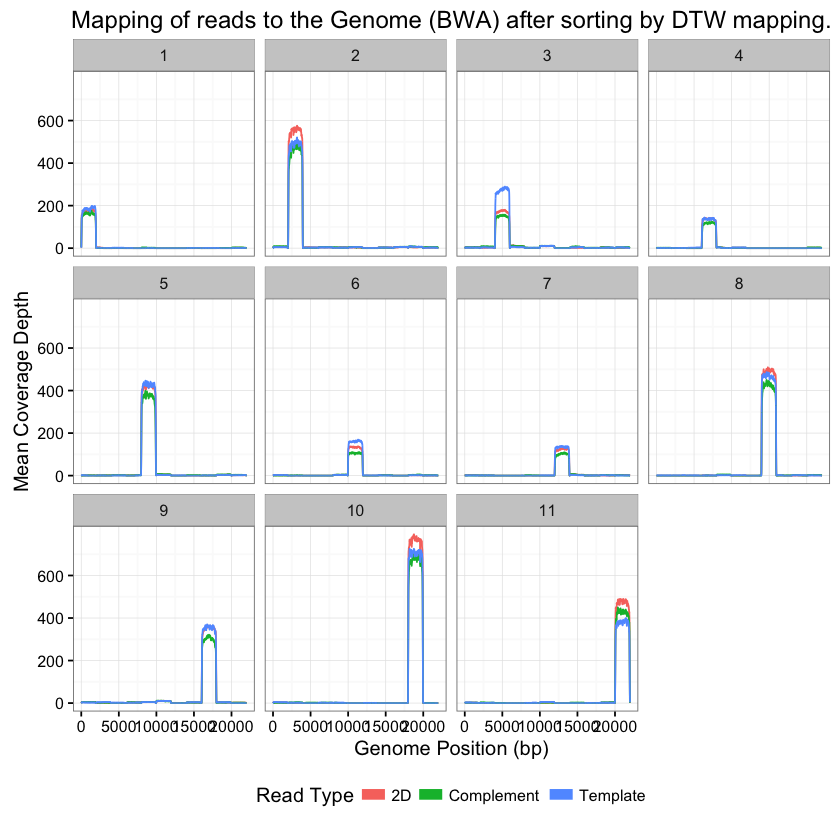

In [43]:
ggplot(data=allamplicondata,aes(x=Position,y=Depth,color=Type)) + geom_line()+ facet_wrap(~Amplicon) +theme_bw() + xlim(0,22000) + coord_trans(x="identity", y="identity")  + labs(title = "Mapping of reads to the Genome (BWA) after sorting by DTW mapping.",x = "Genome Position (bp)", y = "Mean Coverage Depth") + scale_colour_discrete(name  = "Read Type") + theme(legend.position="bottom" , legend.key = element_blank() ) + guides(colour = guide_legend(override.aes = list(size=3)))


Warning message:
: Removed 79356 rows containing missing values (geom_path).

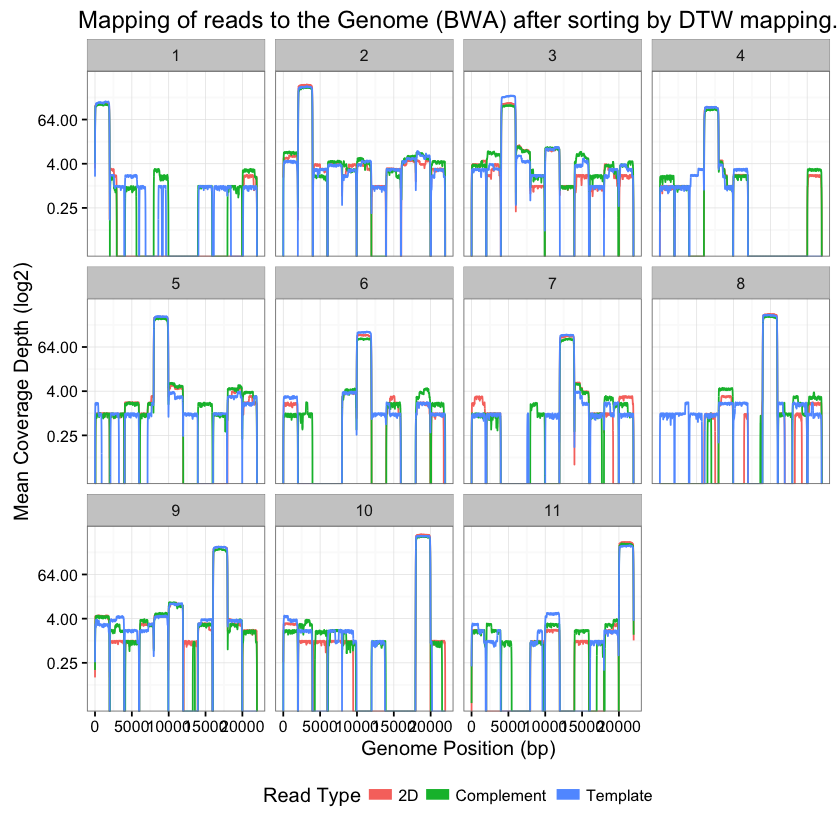

In [42]:
ggplot(data=allamplicondata,aes(x=Position,y=Depth,color=Type)) + geom_line()+ facet_wrap(~Amplicon) +theme_bw() + xlim(0,22000) + coord_trans(x="identity", y="identity")  + labs(title = "Mapping of reads to the Genome (BWA) after sorting by DTW mapping.",x = "Genome Position (bp)", y = "Mean Coverage Depth (log2)")+  scale_y_continuous(trans = "log2") + scale_colour_discrete(name  = "Read Type") + theme(legend.position="bottom" , legend.key = element_blank() ) + guides(colour = guide_legend(override.aes = list(size=3)))